In [ ]:
# Today, AI is everywhere, we are able to do many things with it.
# I will be exploring one of the key areas within AI, classification, which is a field currently under research, and we have not fully yet found out the limitations
# We've trained AI which can classify animals, plants, cars, and medicine, among other things.
# However, the main problem in hand revolves around the AI's capability to effectively classify manipulated images and the extent of training required to enable the AI to reliably detect these altered images.
# This is where the AI is most vulnerable as it is not able to adapt quickly to evolving image manipulation techniques and this is what I will be aiming to research and come to a solution where I aim to see how easily I can manipulate the AI into classifying the hacked images.


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/1020 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/2.1.1.incompleteM2BJ97/oxford_flowers102-train.tfrecord*…

Generating test examples...:   0%|          | 0/6149 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/2.1.1.incompleteM2BJ97/oxford_flowers102-test.tfrecord*.…

Generating validation examples...:   0%|          | 0/1020 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/oxford_flowers102/2.1.1.incompleteM2BJ97/oxford_flowers102-validation.tfre…

Dataset oxford_flowers102 downloaded and prepared to /root/tensorflow_datasets/oxford_flowers102/2.1.1. Subsequent calls will reuse this data.


Number of Adversarial Images: 32
Adversarial Test Accuracy: 0.00%


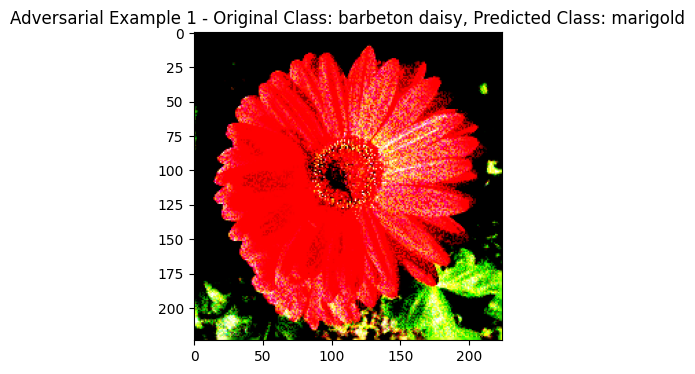

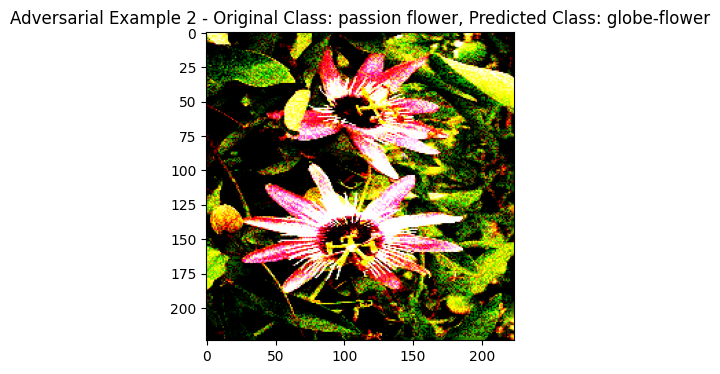

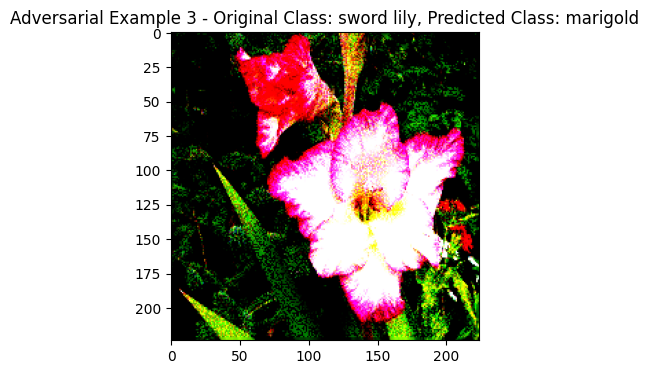

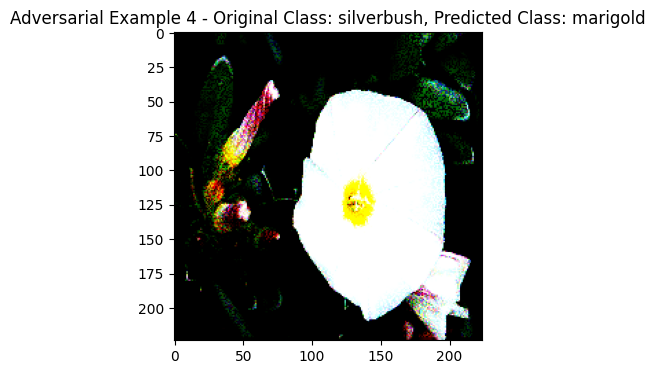

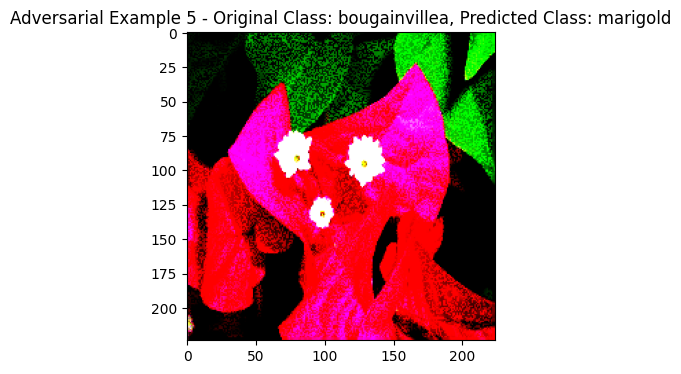

...

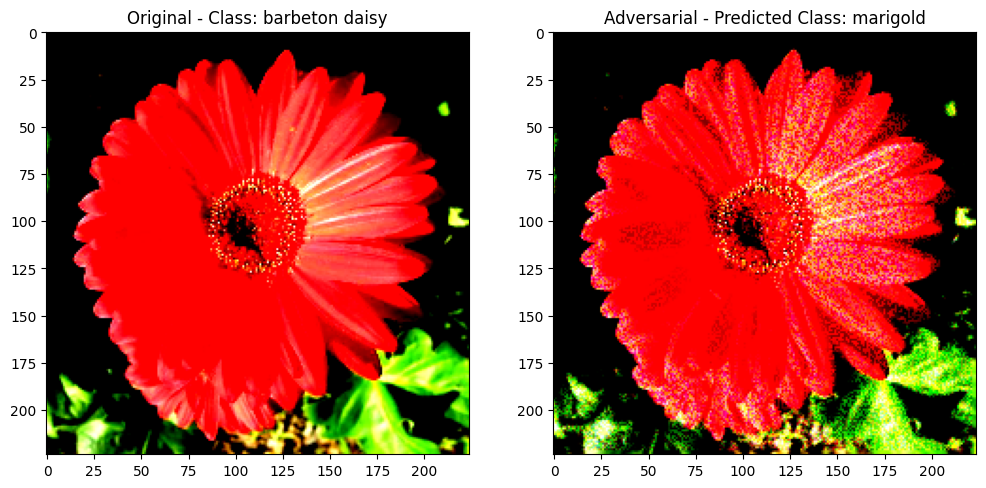

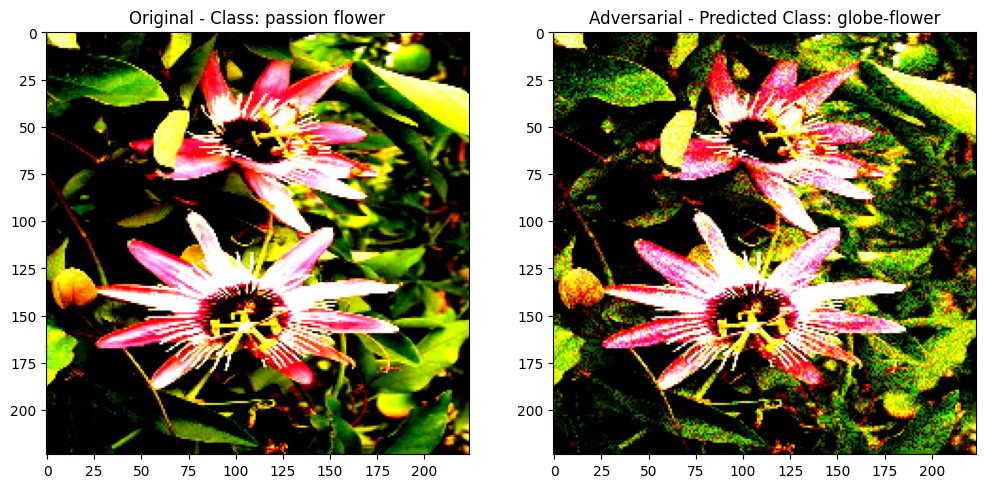

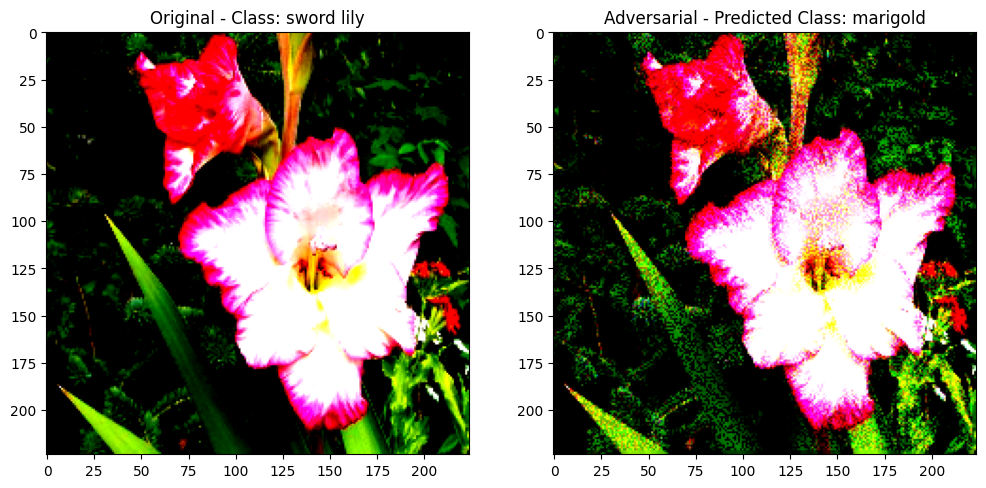

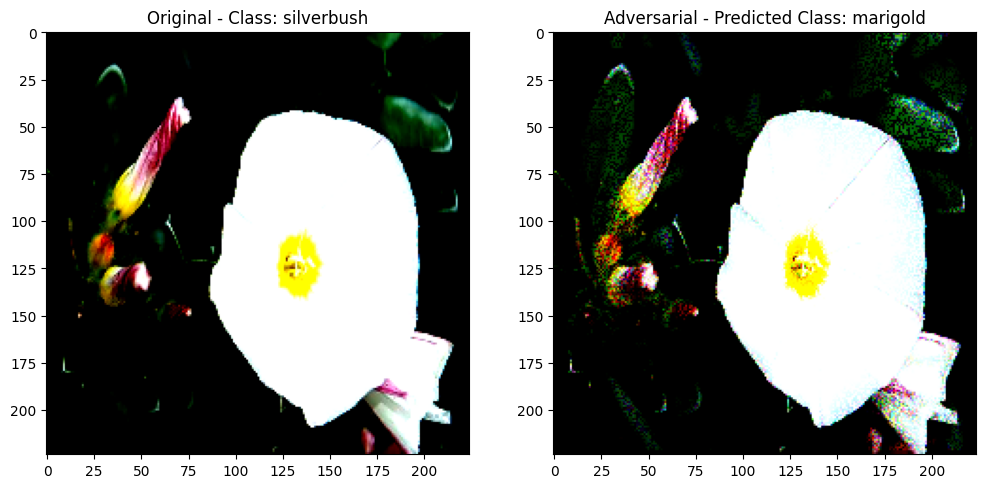

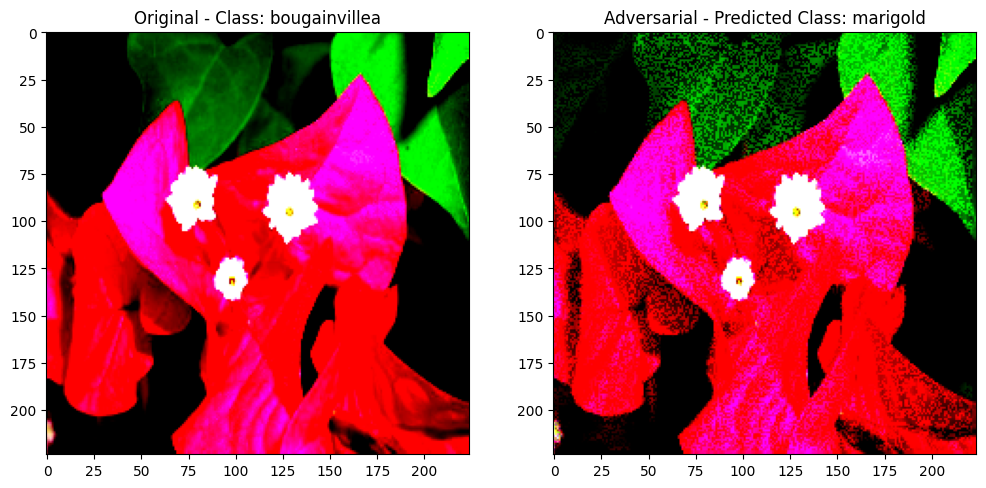

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import Sequential, layers
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
from art.attacks.evasion import FastGradientMethod
from art.estimators.classification import TensorFlowV2Classifier

dataset, dataset_info = tfds.load('oxford_flowers102', split='test', with_info=True, as_supervised=True)
num_classes = dataset_info.features['label'].num_classes
class_names = dataset_info.features['label'].names
def preprocess_image(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.image.per_image_standardization(image)
    label = tf.one_hot(label, num_classes)
    return image, label
test_dataset = dataset.map(preprocess_image).batch(32)
def build_generator(latent_dim):
    model = Sequential()
    model.add(layers.Dense(256, input_dim=latent_dim, activation='relu'))
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dense(3, activation='tanh'))
    return model
def build_discriminator(img_shape):
    model = Sequential()
    model.add(layers.Flatten(input_shape=img_shape))
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    return model
latent_dim = 100
generator = build_generator(latent_dim)
discriminator = build_discriminator((224, 224, 3))
model = Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
art_classifier = TensorFlowV2Classifier(
    model=model,
    nb_classes=num_classes,
    input_shape=(224, 224, 3),
    loss_object=tf.keras.losses.CategoricalCrossentropy(),
)
attack = FastGradientMethod(estimator=art_classifier, eps=0.25)#change eps to make a higher hack.
test_batch = next(iter(test_dataset))
test_images, test_labels = test_batch
adversarial_test_images = attack.generate(test_images.numpy(), y=test_labels.numpy())
original_class_labels = np.argmax(test_labels, axis=1)
adversarial_test_probs = art_classifier.predict(adversarial_test_images)
adversarial_test_labels = np.argmax(adversarial_test_probs, axis=1)
adversarial_test_acc = np.sum(adversarial_test_labels == original_class_labels) / len(original_class_labels)
num_adversarial_images = adversarial_test_images.shape[0]
print(f"Number of Adversarial Images: {num_adversarial_images}")
print(f"Adversarial Test Accuracy: {adversarial_test_acc * 100:.2f}%")
num_display = min(num_adversarial_images, 35)
for i in range(num_display):
    plt.figure(figsize=(8, 4))
    plt.imshow(adversarial_test_images[i])
    plt.title(f'Adversarial Example {i + 1} - Original Class: {class_names[original_class_labels[i]]}, Predicted Class: {class_names[adversarial_test_labels[i]]}')
    plt.show()
num_display = min(num_adversarial_images, 5)
for i in range(num_display):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(test_images[i])
    original_class_index = np.argmax(test_labels[i].numpy())
    plt.title(f'Original - Class: {class_names[original_class_index]}')
    plt.subplot(1, 2, 2)
    plt.imshow(adversarial_test_images[i])
    plt.title(f'Adversarial - Predicted Class: {class_names[np.argmax(art_classifier.predict(adversarial_test_images[i][tf.newaxis, ...]))]}')
    plt.show()

#As I mentioned before, I wanted to attempt to Combine both GAN and the Library which really helped my project, here you can see that I have been able to successfully confuse the model, and able to generate the images with different classes.
#You are able to see that we are able to confuse the AI model when you increase the Epsilons.

Epoch 1/25
1/1 [==============================] - 2s 2s/step - loss: 0.7927 - accuracy: 1.0000 - val_loss: 1.6452 - val_accuracy: 0.6552
Epoch 2/25
1/1 [==============================] - 0s 66ms/step - loss: 0.0175 - accuracy: 1.0000 - val_loss: 2.7708 - val_accuracy: 0.4483
Epoch 3/25
1/1 [==============================] - 0s 64ms/step - loss: 4.5412e-04 - accuracy: 1.0000 - val_loss: 5.2217 - val_accuracy: 0.1379
Epoch 4/25
1/1 [==============================] - 0s 66ms/step - loss: 2.5272e-05 - accuracy: 1.0000 - val_loss: 8.5376 - val_accuracy: 0.0345
Epoch 5/25
1/1 [==============================] - 0s 70ms/step - loss: 1.9868e-06 - accuracy: 1.0000 - val_loss: 12.3918 - val_accuracy: 0.0000e+00
Epoch 6/25
1/1 [==============================] - 0s 67ms/step - loss: 1.5895e-07 - accuracy: 1.0000 - val_loss: 16.5227 - val_accuracy: 0.0000e+00
Epoch 7/25
1/1 [==============================] - 0s 65ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 20.7801 - val_accuracy: 0.000

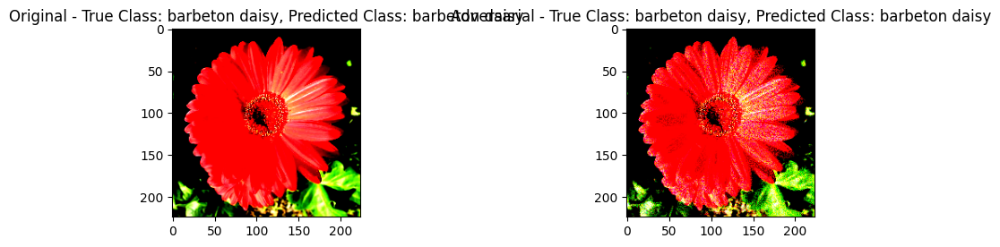

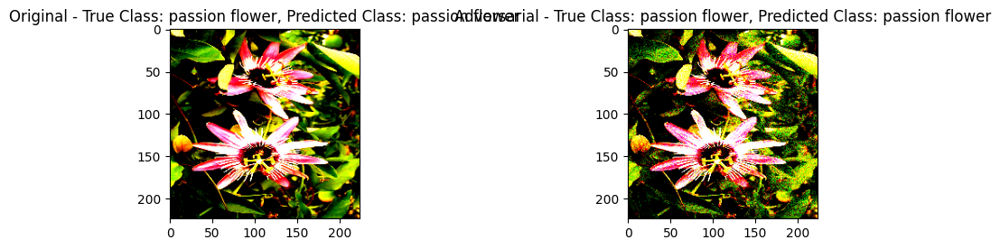

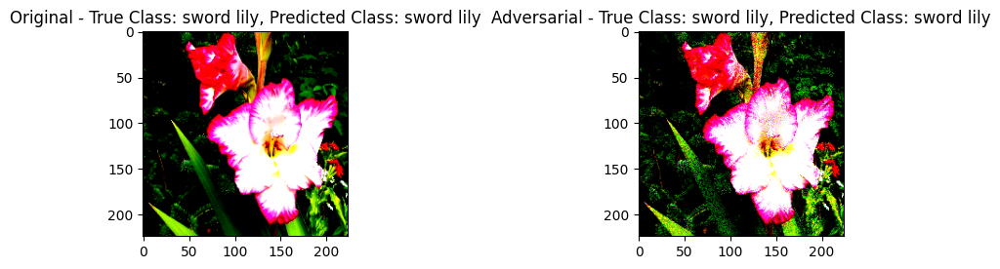

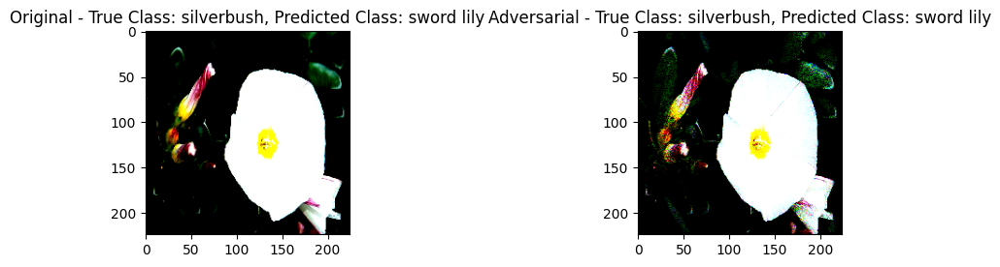

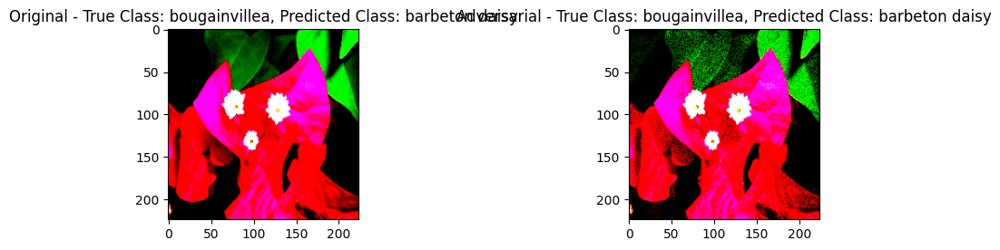

...

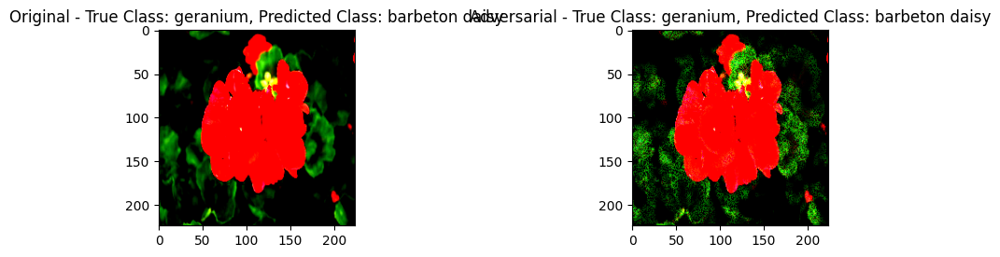

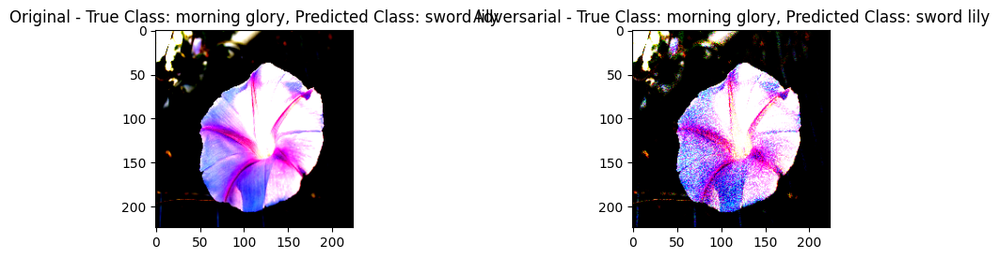

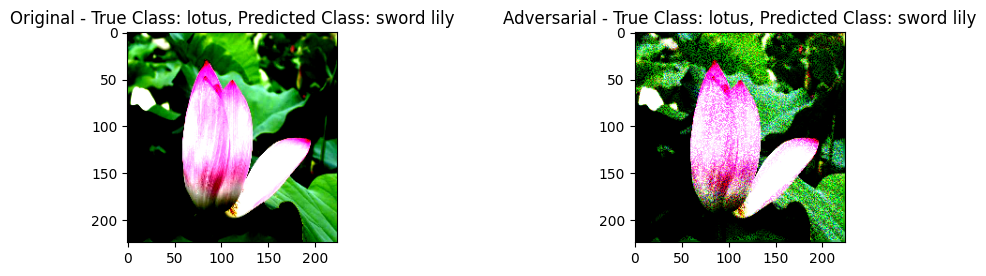

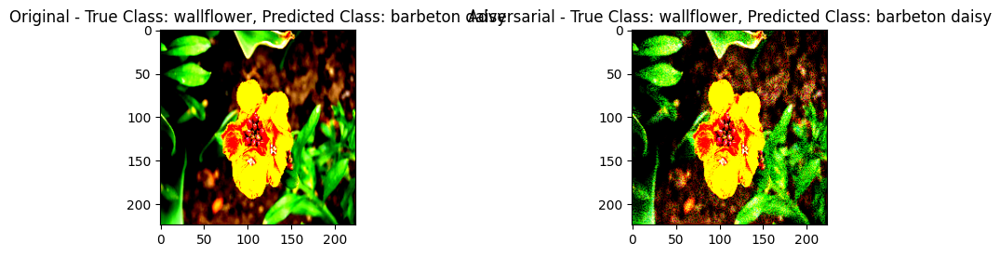

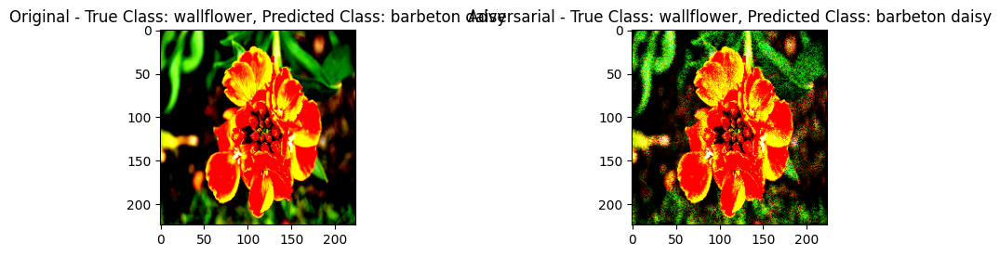

In [ ]:
model.fit(adversarial_test_images, test_labels, epochs=25, batch_size=32, validation_split=0.9)
loss, accuracy = model.evaluate(adversarial_test_images, test_labels)
print(f'Retrained Model - Loss: {loss}, Accuracy: {accuracy}')
original_predictions = model.predict(test_images)
adversarial_predictions = model.predict(adversarial_test_images)
num_display = min(num_adversarial_images, 25)
for i in range(num_display):
    plt.figure(figsize=(12, 6))
    plt.subplot(2, 2, 1)
    plt.imshow(test_images[i])
    original_class_index = np.argmax(test_labels[i].numpy())
    plt.title(f'Original - True Class: {class_names[original_class_index]}, Predicted Class: {class_names[np.argmax(original_predictions[i])]}')
    plt.subplot(2, 2, 2)
    plt.imshow(adversarial_test_images[i])
    plt.title(f'Adversarial - True Class: {class_names[original_class_index]}, Predicted Class: {class_names[np.argmax(adversarial_predictions[i])]}')
    plt.show()
